In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
!pip install -r requirements.txt  # install


Cloning into 'yolov5'...
remote: Enumerating objects: 15305, done.
remote: Total 15305 (delta 0), reused 0 (delta 0), pack-reused 15305
Receiving objects: 100% (15305/15305), 14.13 MiB | 25.97 MiB/s, done.
Resolving deltas: 100% (10501/10501), done.
/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 7.6 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 63.4.3
    Uninstalling setuptools-63.4.3:
      Successfully uninstalled setuptools-63.4.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.9.0 requires jedi>=0.10, which is not i

In [3]:
%cd /content/yolov5
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="UeHVIGeJDAkEamaOlzUC")
project = rf.workspace("obmslab").project("wbcdetection")
dataset = project.version(3).download("yolov5")


# h4WkooMoCPgds1Tu4wbu

# from roboflow import Roboflow
# rf = Roboflow(api_key="UeHVIGeJDAkEamaOlzUC")
# project = rf.workspace("joydip-sarkar").project("wbc-subtypes")
# dataset = project.version(1).download("yolov5")

/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to wbcdetection-3 in yolov5pytorch:: 100%|██████████| 1722/1722 [00:00<00:00, 2580.88it/s]


In [4]:

# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- eosinophil
- lymphocyte
- monocyte
- neutrophil
nc: 4
roboflow:
  license: CC BY 4.0
  project: wbcdetection
  url: https://universe.roboflow.com/obmslab/wbcdetection/dataset/3
  version: 3
  workspace: obmslab
test: ../test/images
train: wbcdetection-3/train/images
val: wbcdetection-3/valid/images


In [5]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])


#this is the model configuration we will use for our tutorial 
%cat /"D:\wbc thesis project\Joydip's Project\joydipcustomyolov5 (1).yaml"

cat: '/D:\wbc thesis project\Joydip'\''s Project\joydipcustomyolov5 (1).yaml': No such file or directory


In [6]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [7]:
%%writetemplate /content/yolov5/models/hub/joydipcustomyolov5.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 4  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors: 3  # AutoAnchor evolves 3 anchors per P output layer

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3TR, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head with (P2, P3, P4, P5) outputs
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [128, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 2], 1, Concat, [1]],  # cat backbone P2
   [-1, 1, C3, [128, False]],  # 21 (P2/4-xsmall)

   [-1, 1, Conv, [128, 3, 2]],
   [[-1, 18, 4], 1, Concat, [1]],  # cat head P3
   [-1, 3, C3, [256, False]],  # 24 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14, 6], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 27 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10, 8], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 30 (P5/32-large)

   [[21, 24, 27, 30], 1, Detect, [nc, anchors]],  # Detect(P2, P3, P4, P5)
  ]


In [8]:
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --cfg /content/yolov5/models/hub/joydipcustomyolov5.yaml  --weights '' --name Customyolov5s_results  --cache

/content/yolov5
train: weights=, cfg=/content/yolov5/models/hub/joydipcustomyolov5.yaml, data=/content/yolov5/wbcdetection-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=Customyolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_

In [9]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [10]:
import numpy as np
import pandas as pd 
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt

In [11]:
df = pd.read_csv("/content/yolov5/runs/train/Customyolov5s_results/results.csv")

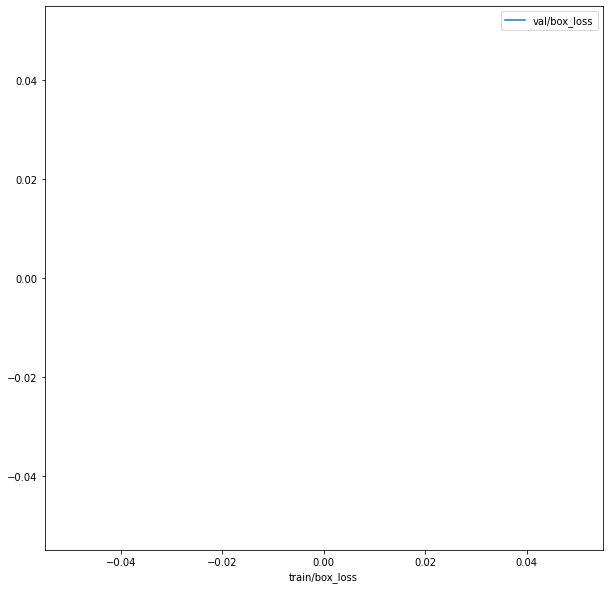

In [12]:
import pandas as pd
import matplotlib.pyplot as mp
 
# form dataframe from data
df1 = pd.DataFrame(df, columns=["train/box_loss", "val/box_loss"])
 
# plot multiple columns such as population and year from dataframe
df1.plot(x="train/box_loss", y=["val/box_loss"],
        kind="line", figsize=(10, 10))
 
# display plot
mp.show()

In [13]:
df.shape

(200, 14)

In [14]:
df.describe([0.10,0.25,0.50,0.75,0.90,0.95,0.99]).T

,count,mean,std,min,10%,25%,50%,75%,90%,95%,99%,max
epoch,200.0,99.500000,57.879185,0.000000,19.900000,49.750000,99.500000,149.250000,179.100000,189.050000,197.010000,199.000000
train/box_loss,200.0,0.029831,0.011337,0.019460,0.020814,0.022680,0.026444,0.033347,0.039732,0.055608,0.075978,0.085010
train/obj_loss,200.0,0.006037,0.001722,0.004102,0.004413,0.004679,0.005347,0.007090,0.009142,0.009448,0.009942,0.010356
train/cls_loss,200.0,0.013475,0.011528,0.002264,0.003754,0.004921,0.008474,0.018069,0.033492,0.038327,0.043216,0.044121
metrics/precision,200.0,0.770545,0.301681,0.000697,0.255269,0.660338,0.923970,0.979075,0.987316,0.990295,0.992842,0.994540
metrics/recall,200.0,0.787646,0.232212,0.040816,0.416023,0.647095,0.905590,0.968060,0.978637,0.983800,0.989069,0.994880
metrics/mAP_0.5,200.0,0.763390,0.311364,0.000789,0.190977,0.607738,0.949475,0.986067,0.993683,0.994362,0.994661,0.995000
metrics/mAP_0.5:0.95,200.0,0.484293,0.232681,0.000233,0.071635,0.337100,0.597170,0.677277,0.701329,0.704982,0.710300,0.713220
val/box_loss,200.0,0.032741,0.014993,0.020808,0.021685,0.022895,0.026906,0.034958,0.052691,0.065071,0.078687,0.116160
val/obj_loss,200.0,0.004172,0.004675,0.002037,0.002179,0.002357,0.003047,0.004620,0.005684,0.007326,0.017970,0.051407


In [15]:
df.corr()

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
epoch,1.000000,-0.804243,-0.913928,-0.890768,0.742607,0.647318,0.757197,0.826383,-0.671439,-0.332393,-0.769091,-0.611147,-0.982189,-0.982189
train/box_loss,-0.804243,1.000000,0.767128,0.913037,-0.836981,-0.442067,-0.812108,-0.796665,0.745475,0.188313,0.715274,0.743948,0.729472,0.729472
train/obj_loss,-0.913928,0.767128,1.000000,0.951705,-0.749631,-0.662488,-0.786007,-0.830376,0.628348,0.289135,0.757449,0.506697,0.910026,0.910026
train/cls_loss,-0.890768,0.913037,0.951705,1.000000,-0.838023,-0.603525,-0.851319,-0.863221,0.718258,0.253351,0.777762,0.630784,0.854175,0.854175
metrics/precision,0.742607,-0.836981,-0.749631,-0.838023,1.000000,0.520170,0.940258,0.923386,-0.837598,-0.354105,-0.869692,-0.552636,-0.705663,-0.705663
metrics/recall,0.647318,-0.442067,-0.662488,-0.603525,0.520170,1.000000,0.711405,0.764413,-0.705271,-0.496533,-0.793734,-0.369381,-0.642075,-0.642075
metrics/mAP_0.5,0.757197,-0.812108,-0.786007,-0.851319,0.940258,0.711405,1.000000,0.981559,-0.903518,-0.501100,-0.955773,-0.551656,-0.722367,-0.722367
metrics/mAP_0.5:0.95,0.826383,-0.796665,-0.830376,-0.863221,0.923386,0.764413,0.981559,1.000000,-0.884461,-0.497558,-0.964732,-0.556403,-0.799330,-0.799330
val/box_loss,-0.671439,0.745475,0.628348,0.718258,-0.837598,-0.705271,-0.903518,-0.884461,1.000000,0.511138,0.889253,0.506192,0.636544,0.636544
val/obj_loss,-0.332393,0.188313,0.289135,0.253351,-0.354105,-0.496533,-0.501100,-0.497558,0.511138,1.000000,0.629178,0.164743,0.335675,0.335675


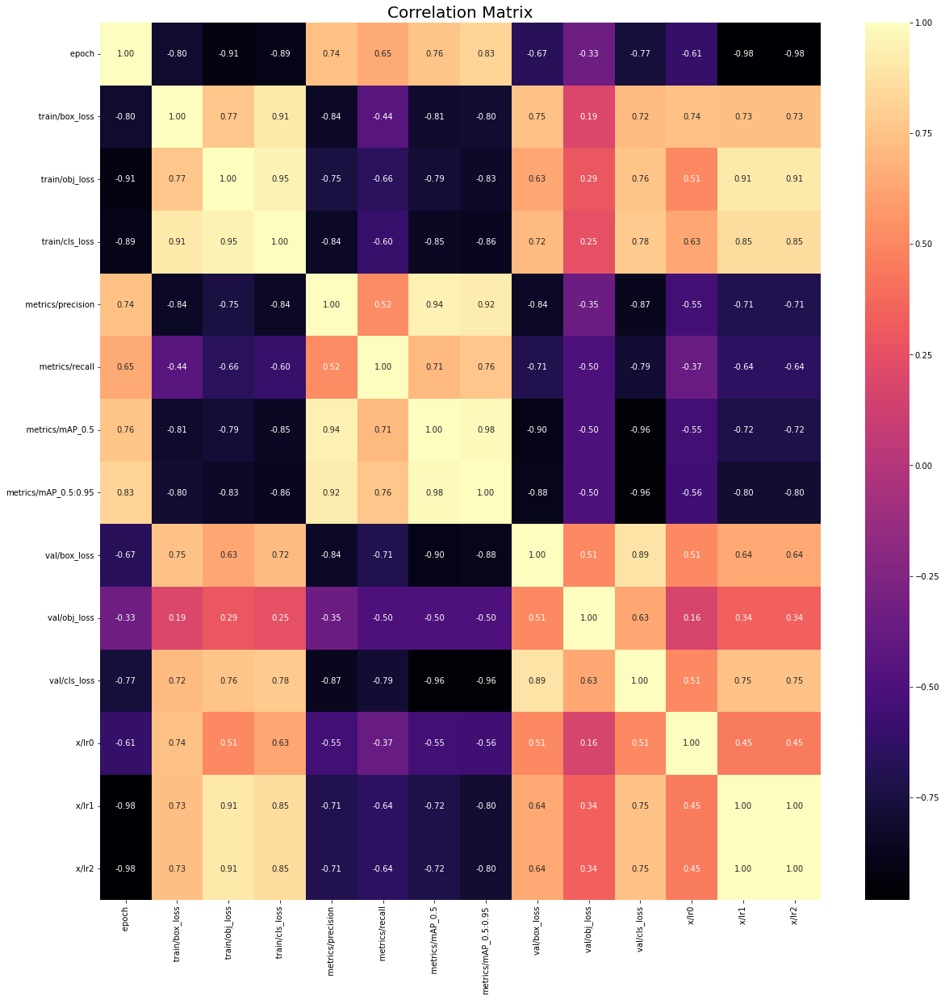

In [16]:
f,ax= plt.subplots(figsize=[20,20])
sns.heatmap(df.corr(), annot= True, fmt=".2f", ax=ax, cmap="magma")
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

In [17]:
from IPython.display import Image

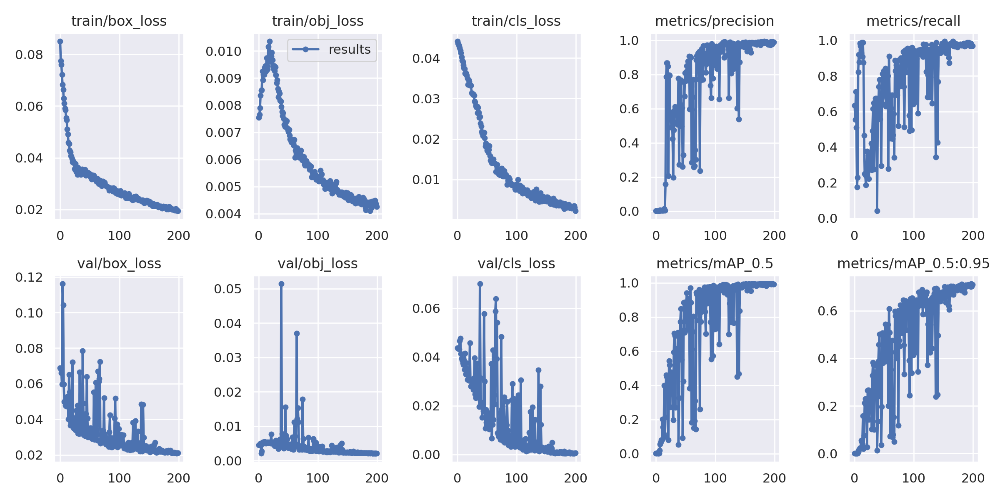

In [18]:
 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/Customyolov5s_results/results.png', width=750)  # view results.png

GROUND TRUTH TRAINING DATA:


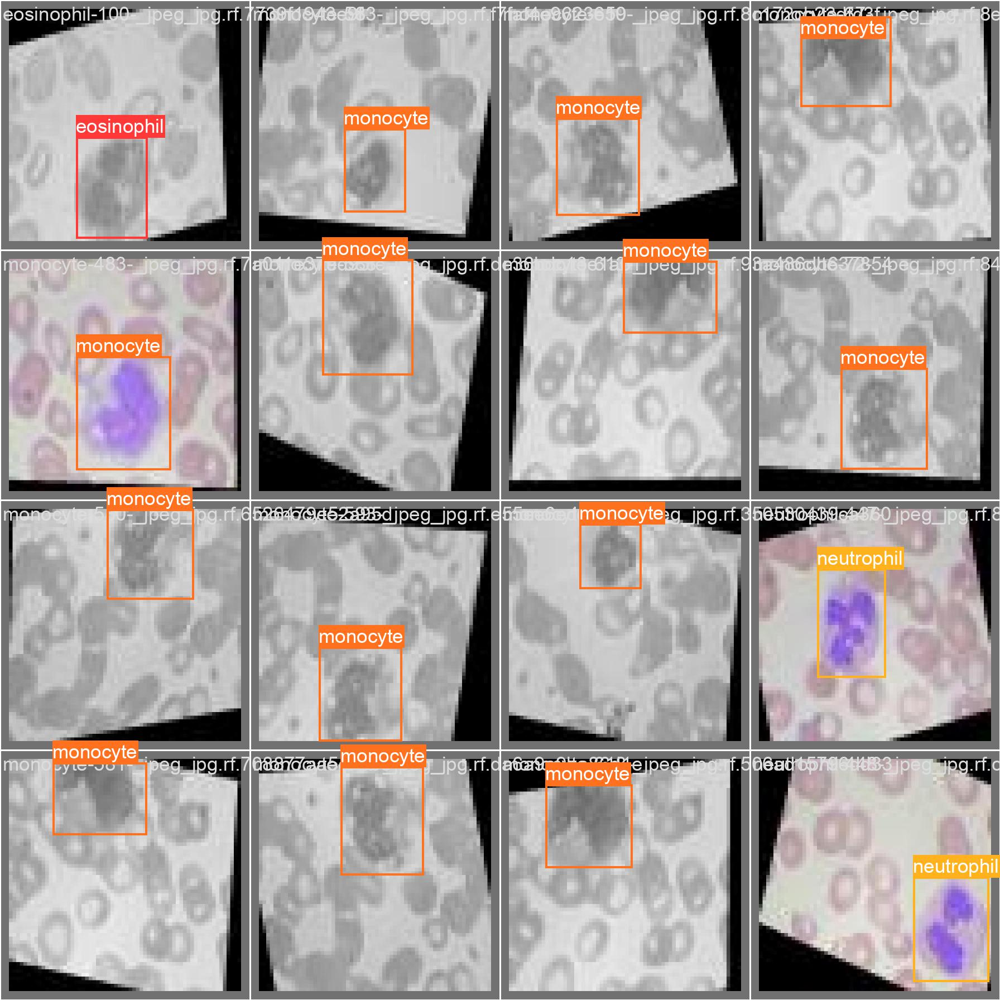

In [20]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/Customyolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


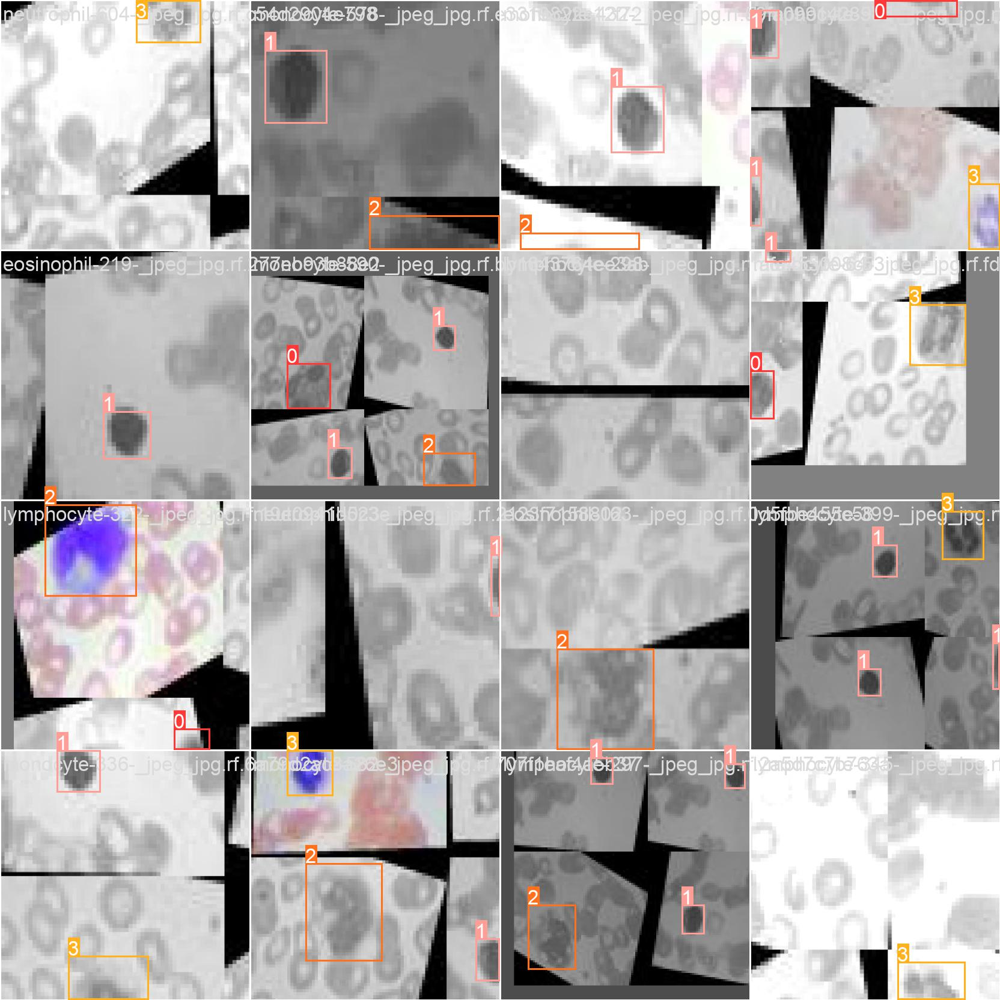

In [21]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/Customyolov5s_results/train_batch0.jpg', width=900)

GROUND TRUTH  DATA:


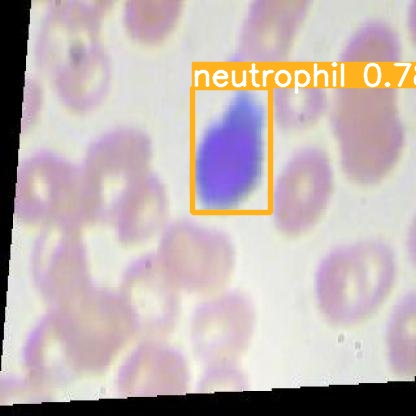

In [39]:
#test image result
print("GROUND TRUTH  DATA:")
Image(filename='/content/yolov5/runs/detect/exp7/_0_547_jpeg.rf.f015f96a853a0fbc7a311dc8edd9fe7a.jpg', width=900)

In [22]:
%ls runs/

train/


In [23]:
%ls runs/train/Customyolov5_results/weights

ls: cannot access 'runs/train/Customyolov5_results/weights': No such file or directory


In [36]:
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/Customyolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/wbcdetection-3/test/images/testimages

/content/yolov5
detect: weights=['/content/yolov5/runs/train/Customyolov5s_results/weights/best.pt'], source=/content/yolov5/wbcdetection-3/test/images/testimages, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
joydipcustomYOLOv5 summary: 196 layers, 7509516 parameters, 0 gradients, 19.0 GFLOPs
image 1/18 /content/yolov5/wbcdetection-3/test/images/testimages/_0_1285_jpeg.rf.585674fc3e786910bdf76039b0662671.jpg: 416x416 1 monocyte, 1 neutrophil, 10.6ms
image 2/18 /content/yolov5/wbcdetection-3/test/images/testimages/_0_2370_jpeg.rf.46162ff1e

In [41]:


import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp7/*.jpeg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
#For uploading the results to Google Drive.
from google.colab import drive
drive.mount('/content/gdrive')


%cp /content/yolov5/runs/train/Customyolov5s_results/weights/best.pt /content/gdrive/My\ Drive

In [ ]:
Image('./runs/train/Result/confusion_matrix.png',width=400)

In [ ]:
  
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5x_results/F1_curve.png', width=750)  # view results.png', width=750)  # view results.png

In [ ]:
%cat ./data/hyp.finetune.yaml